In [1]:
import os
import random
import numpy as np
import time
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision as tv
from IPython.display import HTML

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

num_workers = os.cpu_count()
print(num_workers)

cuda:0
6


In [2]:
seed = 2**12
print(f'Random seed = {seed}')
random.seed(seed)
torch.manual_seed(seed)

Random seed = 4096


In [3]:
data_dir = os.path.join('.', 'data', 'celeba')
batch_size = 128
image_size = 64  # h x w
mean = (.5, .5, .5)
std = (.5, .5, .5)
nc = 3  # # of channels in training image (RGB)
nz = 100  # size of z latent vector (size of generator input)
ngf = 64  # size of feature maps in generator
ndf = 64  # size of feature maps in discriminator
lr = 0.0002  # learning rate
beta1 = 0.5 # hyper parameter for Adam
ngpu = 1  # # of GPUs
num_epochs = 20
total_images = 202_599  # The dataset has 202,599 images in total
n = int(np.ceil(total_images/5))  # # of images for training 
# n = 1000
print(data_dir)

./data/celeba


In [4]:
class LimitedImageFolder(tv.datasets.ImageFolder):
    def __init__(self, root, transform, n):
        super(LimitedImageFolder, self).__init__(root, transform)
        self.n = int(n)
    
    def __len__(self):
        return self.n

#     def __getitem__(self, i):
#         return self.dataset[i]

In [5]:
dataset = LimitedImageFolder(
    root=data_dir,
    transform=tv.transforms.Compose([
        tv.transforms.Resize(image_size),
        tv.transforms.CenterCrop(image_size),
        tv.transforms.ToTensor(),
        tv.transforms.Normalize(mean, std)]),
    n=n)
data_loader = torch.utils.data.DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers)

print(len(data_loader.dataset))

40520


torch.Size([128, 3, 64, 64])
(530, 530, 3)


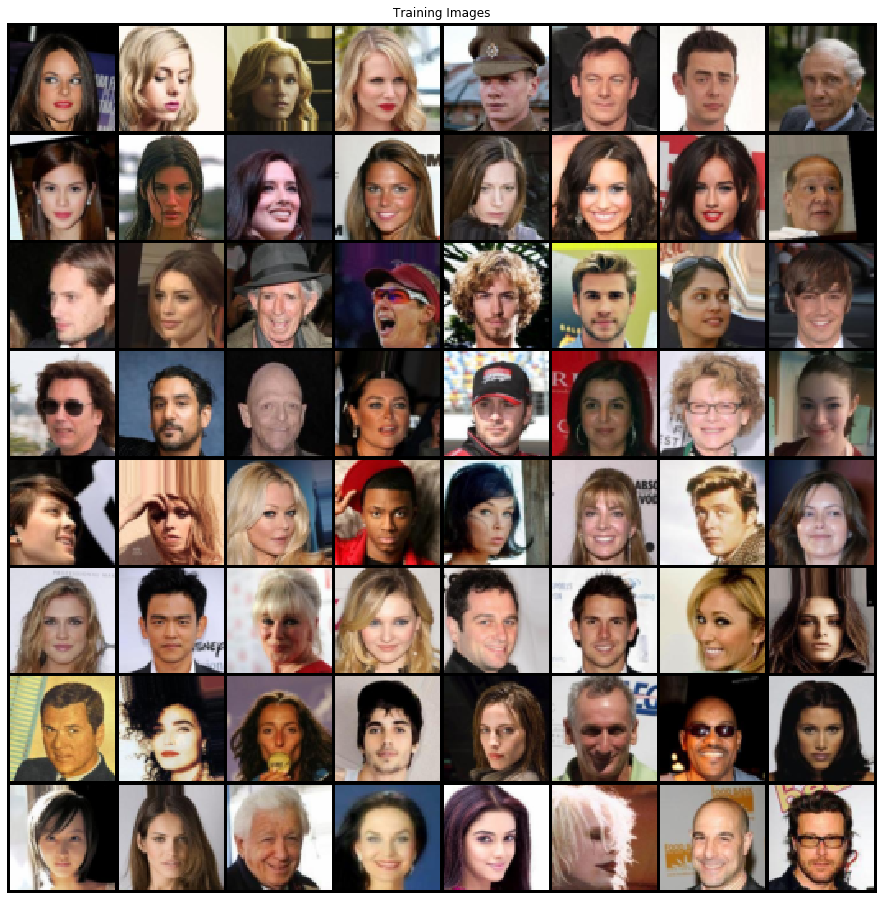

In [6]:
first_batch = next(iter(data_loader))[0]
tensor = first_batch.cpu()
print(tensor.size())
images = tv.utils.make_grid(tensor[:64], padding=2, normalize=True)
images = images.numpy().transpose((1,2,0))
# images = std * images + mean
# images = np.clip(images, 0, 1)
print(images.shape)

plt.figure(figsize=(16,16))
plt.axis('off')
plt.title('Training Images')
plt.imshow(images)

In [7]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [8]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [9]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [10]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [11]:
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [12]:
loss_fn = nn.BCELoss()  # Binary Cross Entropy Loss

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))

## Training
- Part 1 - Train discriminator
- Part 2 - Train generator


- Loss_D: discriminator loss calculated as the sum of losses for the all real and all fake batches (log(D(x))+log(D(G(z))))
- Loss_G: generator loss calculated as log(D(G(z)))
- D(x): the average output (across the batch) of the discriminator for the all real batch. This should start close to 1 then theoretically converge to 0.5 when G gets better.
- D(G(z)): average discriminator outputs for the all fake batch. The first number is before D is updated and the second number is after D is updated. These numbers should start near 0 and converge to 0.5 as G gets better.

In [13]:
img_list = []
G_losses = []
D_losses = []
iters = 0
start = time.time()

print("Starting Training Loop...")
for epoch in range(num_epochs):
    epoch_start = time.time()
    for i, data in enumerate(data_loader):
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ## Train with all-real batch
        netD.zero_grad()
        real = data[0].to(device)
        b_size = real.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real).view(-1)
        errD_real = loss_fn(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = loss_fn(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
        
        # (2) Update G network: maximize log(D(G(z)))
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = loss_fn(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('Epoch:[{:d}/{:d}] Batch:[{:4d}/{:4d}] - Loss_D: {:.4f}, Loss_G: {:.4f}, D(x): {:.4f}, D(G(z)): {:.4f}/{:.4f}'.format(
                epoch, num_epochs, 
                i, len(data_loader),
                errD.item(), 
                errG.item(), 
                D_x, 
                D_G_z1, 
                D_G_z2))
            
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(tv.utils.make_grid(fake, padding=2, normalize=True))

        iters += 1
    time_elasped = time.time() - epoch_start
    print('Epoch {} - {:.0f}m {:.1f}s'.format(
        epoch,
        time_elasped//60,
        time_elasped%60))

runtime = time.time() - start
print('Total runtime: {:.0f}m {:.1f}s'.format(
    runtime//60,
    runtime%60))

Starting Training Loop...
Epoch:[0/20] Batch:[   0/ 317] - Loss_D: 1.8060, Loss_G: 3.2464, D(x): 0.3468, D(G(z)): 0.3713/0.0546
Epoch:[0/20] Batch:[  50/ 317] - Loss_D: 0.4810, Loss_G: 13.0438, D(x): 0.8191, D(G(z)): 0.0000/0.0000
Epoch:[0/20] Batch:[ 100/ 317] - Loss_D: 0.8685, Loss_G: 17.2058, D(x): 0.6136, D(G(z)): 0.0000/0.0000
Epoch:[0/20] Batch:[ 150/ 317] - Loss_D: 0.4431, Loss_G: 2.3314, D(x): 0.8056, D(G(z)): 0.1067/0.1398
Epoch:[0/20] Batch:[ 200/ 317] - Loss_D: 0.4125, Loss_G: 3.4441, D(x): 0.7909, D(G(z)): 0.0856/0.0551
Epoch:[0/20] Batch:[ 250/ 317] - Loss_D: 0.7110, Loss_G: 4.8021, D(x): 0.8954, D(G(z)): 0.3825/0.0167
Epoch:[0/20] Batch:[ 300/ 317] - Loss_D: 0.8537, Loss_G: 6.5162, D(x): 0.9205, D(G(z)): 0.4584/0.0048
Epoch 0 - 0m 38.7s
Epoch:[1/20] Batch:[   0/ 317] - Loss_D: 1.0411, Loss_G: 2.0474, D(x): 0.5457, D(G(z)): 0.1215/0.1946
Epoch:[1/20] Batch:[  50/ 317] - Loss_D: 0.5785, Loss_G: 3.8185, D(x): 0.7711, D(G(z)): 0.1894/0.0385
Epoch:[1/20] Batch:[ 100/ 317] - Lo

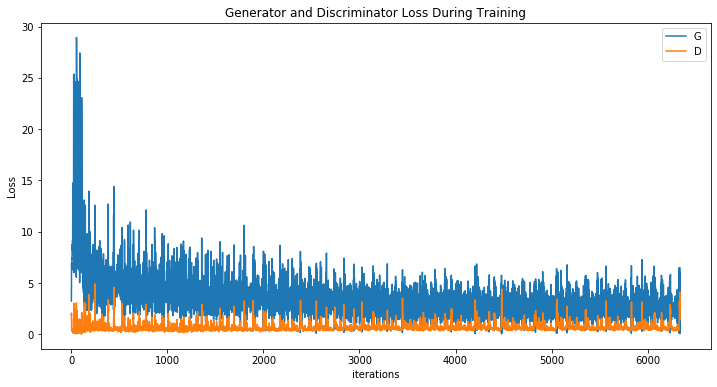

In [14]:
plt.figure(figsize=(12,6))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

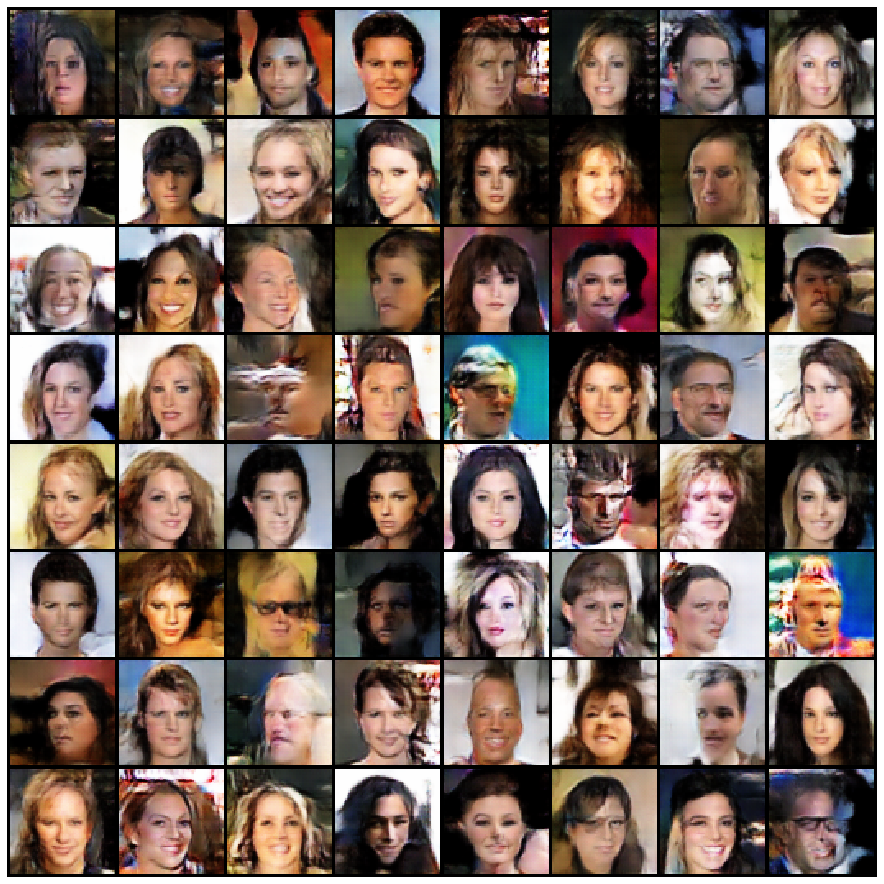

In [15]:
fig = plt.figure(figsize=(16,16))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

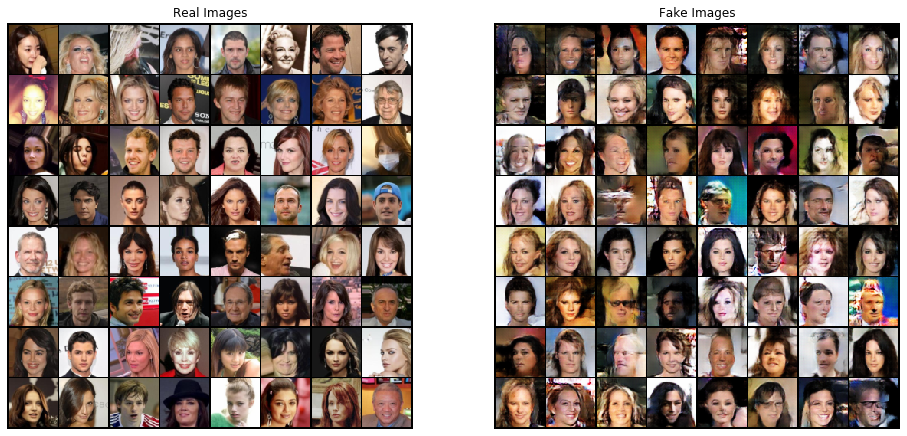

In [16]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(data_loader))
tensor = real_batch[0].cpu()
grid_img = tv.utils.make_grid(
    tensor[:64], 
    padding=2, 
    normalize=True)
grid_img = np.transpose(grid_img.numpy(), (1,2,0))

# Plot the real images
plt.figure(figsize=(16,16))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(grid_img)

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()